In [1]:
from pathlib import Path
from skimage.filters import threshold_otsu
from scipy import stats
from skimage.measure import label, regionprops
from skimage.feature import graycomatrix, graycoprops
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.decomposition import PCA


import tifffile as tiff
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

In [2]:
ROOT = Path.home() / "Documents/project_004/data/data_small_zfish"
files = sorted(p for p in ROOT.glob("*.[tif][iI][fF]*"))
len(files), files

(6,
 [PosixPath('/home/pxbloe/Documents/project_004/data/data_small_zfish/Control1.tif'),
  PosixPath('/home/pxbloe/Documents/project_004/data/data_small_zfish/Control2.tif'),
  PosixPath('/home/pxbloe/Documents/project_004/data/data_small_zfish/Mutant1.tif'),
  PosixPath('/home/pxbloe/Documents/project_004/data/data_small_zfish/Mutant2.tif'),
  PosixPath('/home/pxbloe/Documents/project_004/data/data_small_zfish/Mutant3.tif'),
  PosixPath('/home/pxbloe/Documents/project_004/data/data_small_zfish/Mutant4.tif')])

In [3]:
# read each stack; ensure shape is (T,H,W); normalize per frame to [0,1]
stacks = [tiff.imread(str(f)) for f in files]
norm = lambda s: (s - np.min(s, axis=(1,2), keepdims=True)) / (np.ptp(s, axis=(1,2), keepdims=True) + 1e-8)
stacks = [norm(s.astype(np.float32)) for s in stacks]

# concatenate all frames from all stacks
images = np.concatenate(stacks, axis=0)
images.shape

(2700, 200, 200)

In [4]:
EPS = 1e-6
masks = (images > EPS).astype(np.uint8)
print("masks shape:", masks.shape, "dtype:", masks.dtype)

masks shape: (2700, 200, 200) dtype: uint8


In [5]:
embryo_ids = [Path(str(p)).stem for p in files]
lengths = [s.shape[0] for s in stacks]

dfmeta = pd.DataFrame({
    "embryo_id": np.concatenate([[eid]*L for eid, L in zip(embryo_ids, lengths)]),
    "frame_idx": np.concatenate([np.arange(L) for L in lengths]),
})
print(dfmeta.shape)
dfmeta.head()

(2700, 2)


,embryo_id,frame_idx
0,Control1,0
1,Control1,1
2,Control1,2
3,Control1,3
4,Control1,4


In [6]:
N = images.shape[0]
flat_masked = np.where(masks.reshape(N, -1)>0, images.reshape(N, -1), np.nan)

i_min  = np.nanmin(flat_masked, axis=1)
i_max  = np.nanmax(flat_masked, axis=1)
i_mean = np.nanmean(flat_masked, axis=1)
i_std  = np.nanstd(flat_masked, axis=1)
# skew and kurtosis requires NaN:
vals = [row[~np.isnan(row)] for row in flat_masked]
i_skew = np.array([stats.skew(v, bias=False) if v.size>2 else np.nan for v in vals])
i_kurt = np.array([stats.kurtosis(v, bias=False) if v.size>3 else np.nan for v in vals])

area_mask = masks.reshape(N, -1).sum(axis=1).astype(float)

feats_A = pd.DataFrame({
    "i_min": i_min, "i_max": i_max, "i_mean": i_mean, "i_std": i_std,
    "i_skew": i_skew, "i_kurt": i_kurt, "area_mask": area_mask
})
feats_A.describe().T


/tmp/ipykernel_6918/2205920305.py:4: RuntimeWarning: All-NaN slice encountered
  i_min  = np.nanmin(flat_masked, axis=1)
/tmp/ipykernel_6918/2205920305.py:5: RuntimeWarning: All-NaN slice encountered
  i_max  = np.nanmax(flat_masked, axis=1)
/tmp/ipykernel_6918/2205920305.py:6: RuntimeWarning: Mean of empty slice
  i_mean = np.nanmean(flat_masked, axis=1)
/home/pxbloe/anaconda3/lib/python3.13/site-packages/numpy/lib/_nanfunctions_impl.py:2053: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


,count,mean,std,min,25%,50%,75%,max
i_min,2698.0,0.005305,0.000514,0.004202,0.004950,0.005291,0.005618,0.007042
i_max,2698.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
i_mean,2698.0,0.597997,0.074949,0.409660,0.538607,0.604590,0.656453,0.745255
i_std,2698.0,0.228594,0.028999,0.149077,0.207615,0.222399,0.249800,0.312390
i_skew,2698.0,-0.612248,0.487372,-2.756029,-0.911334,-0.570590,-0.338720,0.541766
i_kurt,2698.0,-0.071863,1.236389,-1.356557,-0.753143,-0.488084,0.207047,8.424710
area_mask,2700.0,10297.228889,1184.090346,0.000000,9662.750000,10290.500000,11024.000000,13202.000000


In [7]:
areas, perims, eccs, solids, extents, maj_ax, min_ax, aratios, compact = [],[],[],[],[],[],[],[],[]

for m in masks:
    lab = label(m, connectivity=2)
    if lab.max() == 0:
        areas.append(np.nan); perims.append(np.nan); eccs.append(np.nan)
        solids.append(np.nan); extents.append(np.nan)
        maj_ax.append(np.nan); min_ax.append(np.nan)
        aratios.append(np.nan); compact.append(np.nan)
        continue
    props = sorted(regionprops(lab), key=lambda p: p.area, reverse=True)[0]
    A = float(props.area)
    P = float(props.perimeter) if props.perimeter not in (None, 0) else np.nan
    MAJ = float(props.major_axis_length) if props.major_axis_length else np.nan
    MIN = float(props.minor_axis_length) if props.minor_axis_length else np.nan
    AR  = (MAJ/MIN) if (MAJ and MIN and MIN>0) else np.nan
    C   = (4*np.pi*A/(P**2)) if (P and P>0) else np.nan

    areas.append(A); perims.append(P); eccs.append(float(props.eccentricity))
    solids.append(float(props.solidity)); extents.append(float(props.extent))
    maj_ax.append(MAJ); min_ax.append(MIN); aratios.append(AR); compact.append(C)

feats_B = pd.DataFrame({
    "shape_area": areas, "shape_perimeter": perims, "shape_eccentricity": eccs,
    "shape_solidity": solids, "shape_extent": extents,
    "shape_major_axis": maj_ax, "shape_minor_axis": min_ax,
    "shape_aspect_ratio": aratios, "shape_compactness": compact
})
feats_B.describe().T

,count,mean,std,min,25%,50%,75%,max
shape_area,2698.0,10304.839140,1150.829039,7703.000000,9663.250000,10291.500000,11023.750000,13202.000000
shape_perimeter,2698.0,401.505951,33.456559,339.433550,379.989899,394.818326,418.207413,499.972655
shape_eccentricity,2698.0,0.415672,0.211166,0.038410,0.239249,0.387082,0.567580,0.872433
shape_solidity,2698.0,0.979288,0.007972,0.935422,0.975925,0.982735,0.984654,0.988291
shape_extent,2698.0,0.747686,0.042428,0.579691,0.728511,0.763179,0.776315,0.830640
shape_major_axis,2698.0,124.256905,17.629607,99.998474,113.761001,118.062246,130.280959,185.881978
shape_minor_axis,2698.0,106.678569,6.407750,87.335693,102.270369,108.309901,111.680343,119.411592
shape_aspect_ratio,2698.0,1.174483,0.228725,1.000738,1.029910,1.084546,1.214597,2.046105
shape_compactness,2698.0,0.805331,0.050966,0.599122,0.784507,0.819500,0.838293,0.895611


In [8]:
# a 8 bits para GLCM
imgs8 = (images*255).astype(np.uint8)
#Masking again
imgs8_masked = np.where(masks>0, imgs8, 0).astype(np.uint8)

contr, corr, homog, energy, asm_vals, entropy = [],[],[],[],[],[]

for x in imgs8_masked:
    glcm = graycomatrix(x, distances=[1,2], angles=[0, np.pi/4, np.pi/2, 3*np.pi/4],
                        levels=256, symmetric=True, normed=True)
    contr.append(float(graycoprops(glcm, 'contrast').mean()))
    corr.append(float(graycoprops(glcm, 'correlation').mean()))
    homog.append(float(graycoprops(glcm, 'homogeneity').mean()))
    energy.append(float(graycoprops(glcm, 'energy').mean()))
    asm_vals.append(float(graycoprops(glcm, 'ASM').mean()))
    P = glcm / (glcm.sum() + 1e-12)
    entropy.append(float(-np.sum(P * np.log(P + 1e-12))))

feats_C = pd.DataFrame({"glcm_contrast": contr, "glcm_corr": corr, "glcm_homog": homog,"glcm_energy": energy,
                        "glcm_ASM": asm_vals, "glcm_entropy": entropy})
feats_C.describe().T

,count,mean,std,min,25%,50%,75%,max
glcm_contrast,2700.0,145.309056,42.411290,0.000000,113.373046,141.076082,171.455460,288.180773
glcm_corr,2700.0,0.986277,0.003513,0.966379,0.983964,0.986606,0.988819,1.000000
glcm_homog,2700.0,0.779762,0.027765,0.703433,0.764668,0.780574,0.799441,1.000000
glcm_energy,2700.0,0.735894,0.030234,0.661570,0.717330,0.736126,0.752118,1.000000
glcm_ASM,2700.0,0.542456,0.044849,0.437679,0.514564,0.541884,0.565683,1.000000
glcm_entropy,2700.0,4.787144,0.321425,2.079442,4.569317,4.768520,4.999254,5.576254


In [9]:
low, mid, high = [], [], []
for x in images:
    F = np.fft.fft2(x)
    P = np.abs(F)**2
    H, W = x.shape
    yy, xx = np.mgrid[:H, :W]
    cy, cx = H//2, W//2
    r = np.sqrt((yy-cy)**2 + (xx-cx)**2)
    rmax = r.max()
    low.append(float(P[r < 0.33*rmax].mean()))
    mid.append(float(P[(r >= 0.33*rmax) & (r < 0.66*rmax)].mean()))
    high.append(float(P[r >= 0.66*rmax].mean()))

feats_D = pd.DataFrame({"fft_low": low, "fft_mid": mid, "fft_high": high})
feats_D.describe().T

,count,mean,std,min,25%,50%,75%,max
fft_low,2700.0,0.997474,0.488524,0.0,0.604186,0.815535,1.359414,2.979107
fft_mid,2700.0,8.098535,2.792311,0.0,6.263009,8.366518,10.041776,17.856646
fft_high,2700.0,13437.095285,2886.345096,0.0,11648.304932,13173.834473,15234.293213,21598.523438


In [10]:
# All the features:
base_meta = dfmeta.reset_index(drop=True)
feats_all = pd.concat(
    [base_meta,
     feats_A.reset_index(drop=True),
     feats_B.reset_index(drop=True),
     feats_C.reset_index(drop=True),
     feats_D.reset_index(drop=True)],
    axis=1
)

print("Shape final:", feats_all.shape)
feats_all.columns

Shape final: (2700, 27)


Index(['embryo_id', 'frame_idx', 'i_min', 'i_max', 'i_mean', 'i_std', 'i_skew',
       'i_kurt', 'area_mask', 'shape_area', 'shape_perimeter',
       'shape_eccentricity', 'shape_solidity', 'shape_extent',
       'shape_major_axis', 'shape_minor_axis', 'shape_aspect_ratio',
       'shape_compactness', 'glcm_contrast', 'glcm_corr', 'glcm_homog',
       'glcm_energy', 'glcm_ASM', 'glcm_entropy', 'fft_low', 'fft_mid',
       'fft_high'],
      dtype='object')

In [11]:
df = feats_all.copy()

# Label as Control or Mutant based on names
def label_from_name(s):
    s = str(s).lower()
    if "control" in s:
        return "Control"
    return "Mutant"

df["genotype"] = df["embryo_id"].apply(label_from_name)

# grouos by each embryo
df["group"] = df["embryo_id"]

df[["embryo_id","frame_idx","genotype","group"]].head()

,embryo_id,frame_idx,genotype,group
0,Control1,0,Control,Control1
1,Control1,1,Control,Control1
2,Control1,2,Control,Control1
3,Control1,3,Control,Control1
4,Control1,4,Control,Control1


In [12]:
df = feats_all.copy()

def label_from_name(s):
    return "Control" if "control" in str(s).lower() else "Mutant"

df["genotype"] = df["embryo_id"].apply(label_from_name)  # label
df["group"]    = df["embryo_id"]                         # embryo group
df[["embryo_id","frame_idx","genotype","group"]].head()
df[["embryo_id","genotype"]].drop_duplicates().value_counts()

embryo_id  genotype
Control1   Control     1
Control2   Control     1
Mutant1    Mutant      1
Mutant2    Mutant      1
Mutant3    Mutant      1
Mutant4    Mutant      1
Name: count, dtype: int64

In [13]:
# Choose the 6 embryos you care about
embryos = sorted(df["embryo_id"].unique())[:6]

# All numeric features
num_feats = [c for c in df.columns
             if c not in ["embryo_id", "frame_idx", "genotype", "group"]]

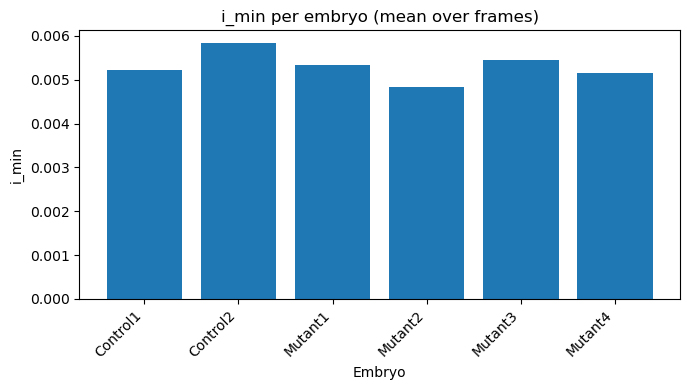

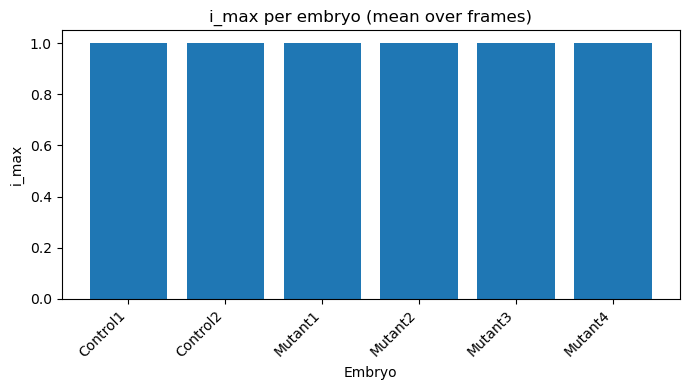

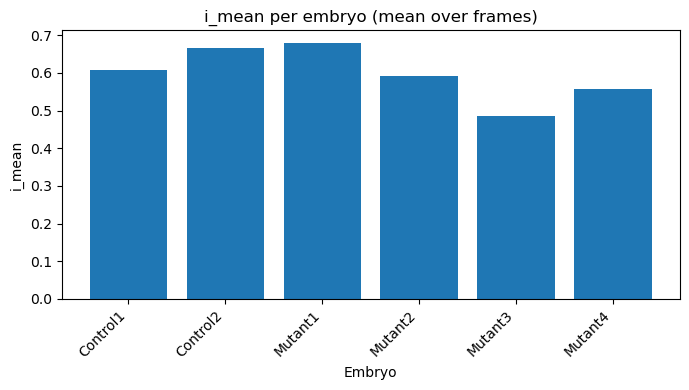

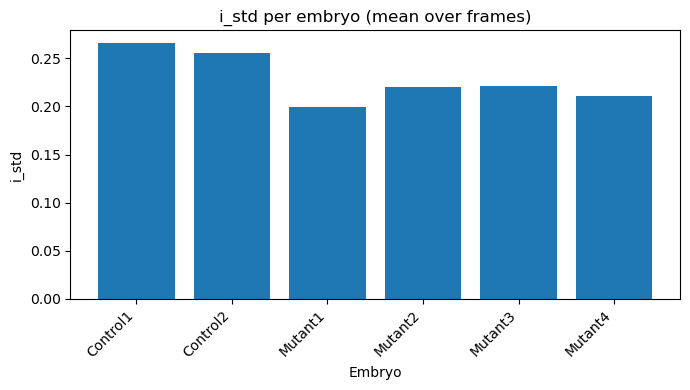

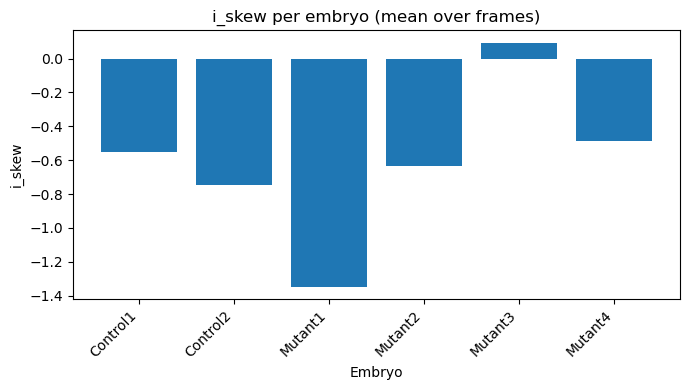

...

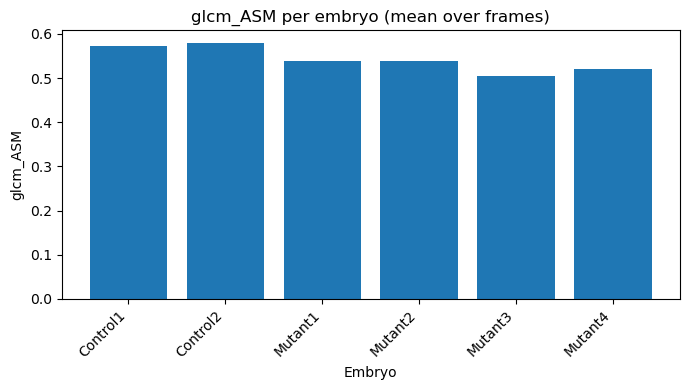

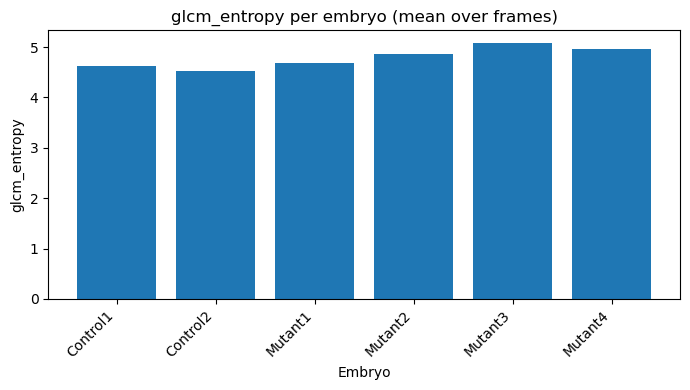

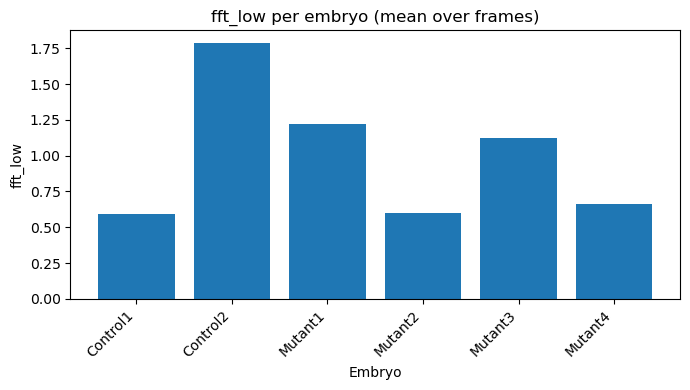

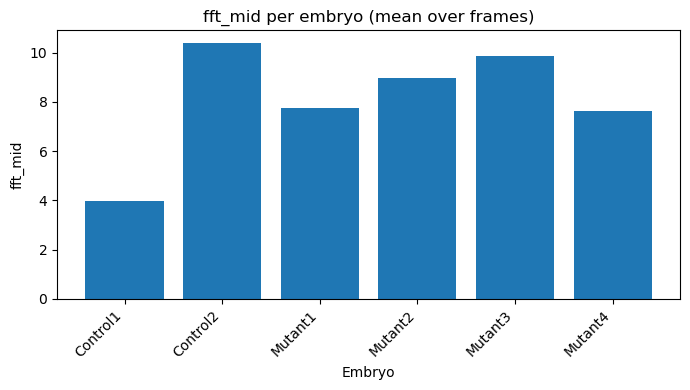

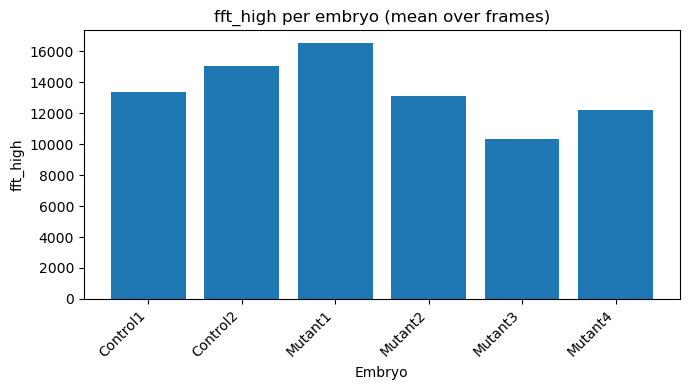

In [14]:
for feat in num_feats:
    plt.figure(figsize=(7, 4))

    #Use the mean of the feature over all frames of each embryo
    summary = (
        df[df["embryo_id"].isin(embryos)]
        .groupby("embryo_id")[feat]
        .mean()
        .reindex(embryos)
    )

    # x = embryos, y = feature value
    x_pos = np.arange(len(embryos))
    plt.bar(x_pos, summary.values)

    plt.xticks(x_pos, embryos, rotation=45, ha="right")
    plt.ylabel(feat)
    plt.xlabel("Embryo")
    plt.title(f"{feat} per embryo (mean over frames)")
    plt.tight_layout()
    plt.show()

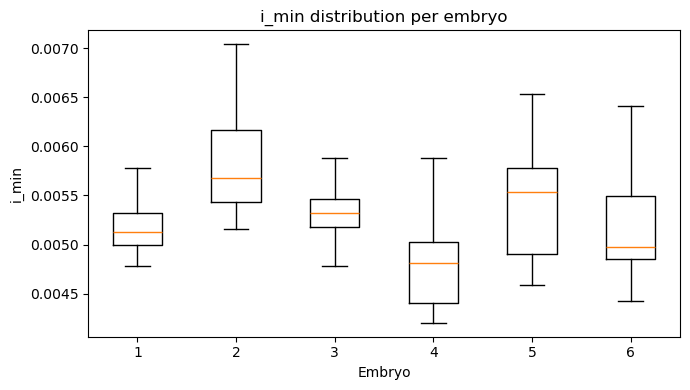

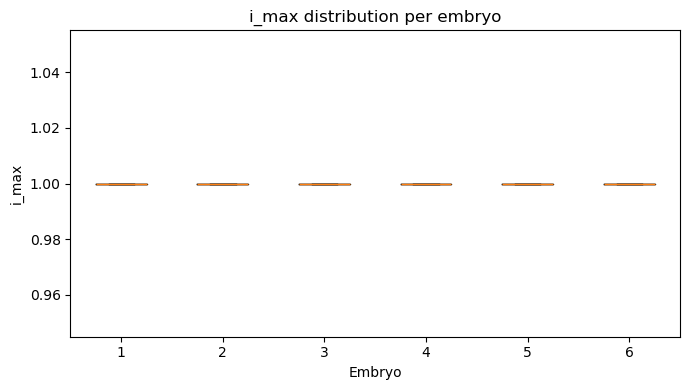

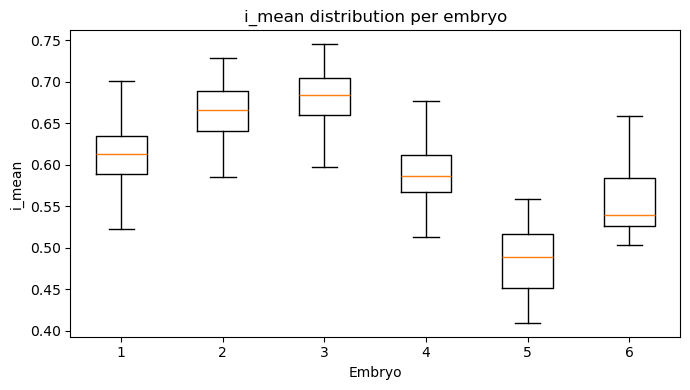

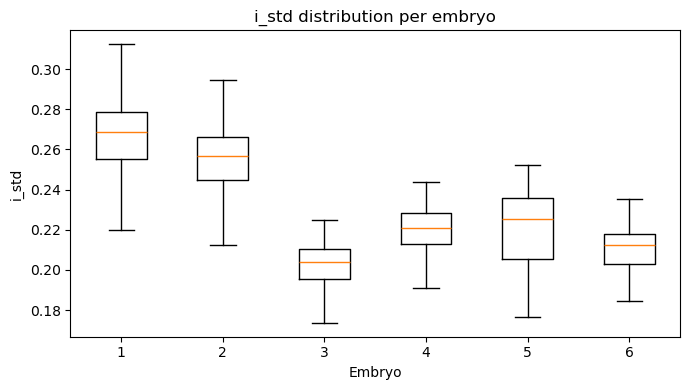

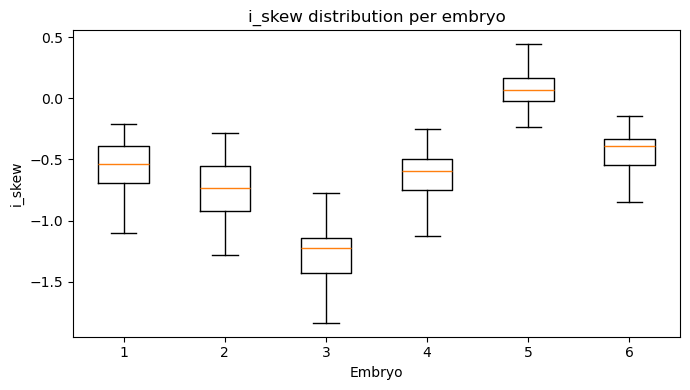

...

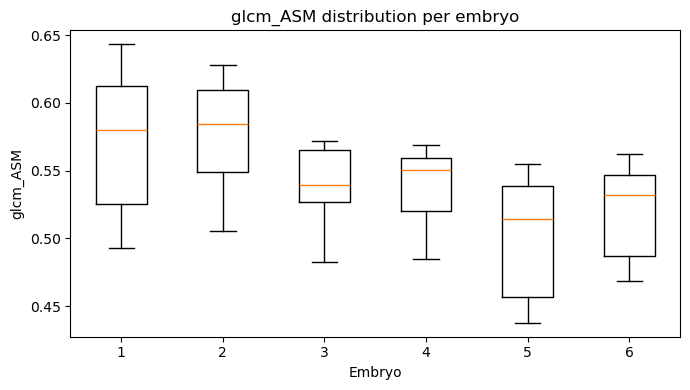

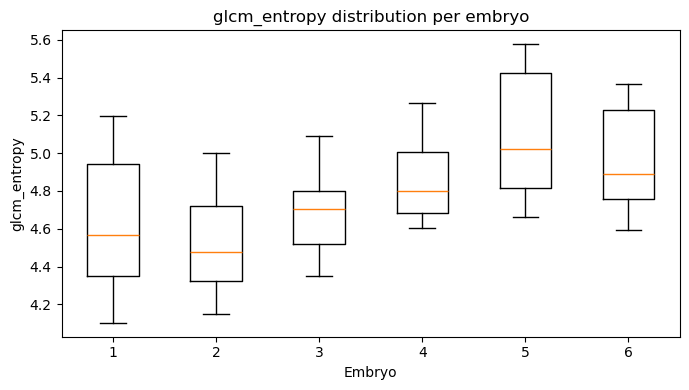

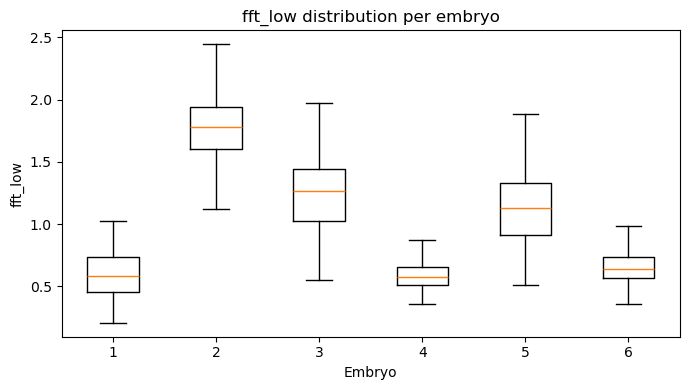

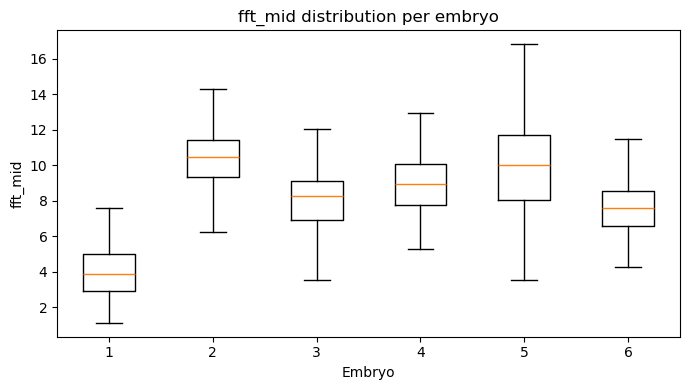

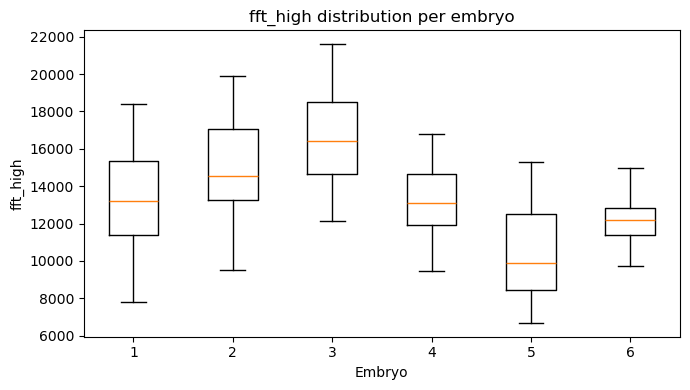

In [16]:
for feat in num_feats:
    plt.figure(figsize=(7, 4))

    data_per_embryo = [
        df.loc[df["embryo_id"] == emb, feat].dropna().values
        for emb in embryos
    ]

    plt.boxplot(data_per_embryo, showfliers=False)
    plt.ylabel(feat)
    plt.xlabel("Embryo")
    plt.title(f"{feat} distribution per embryo")
    plt.tight_layout()
    plt.show()

/tmp/ipykernel_6918/1705694617.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize = (6,4))


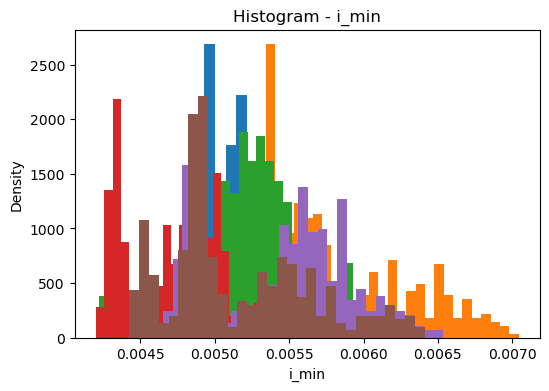

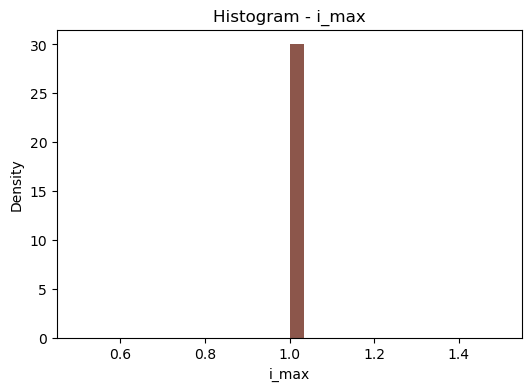

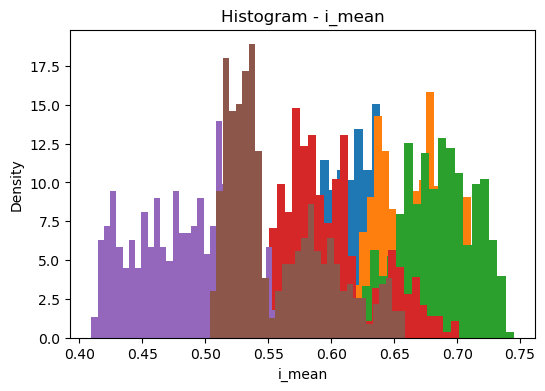

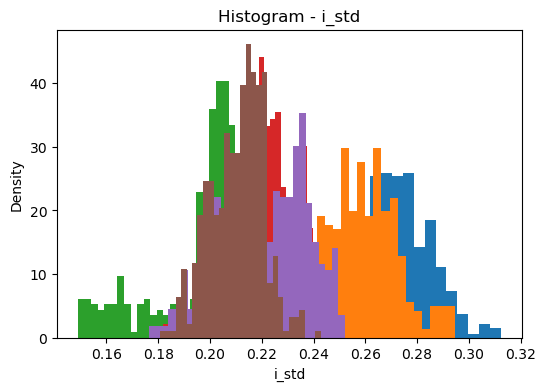

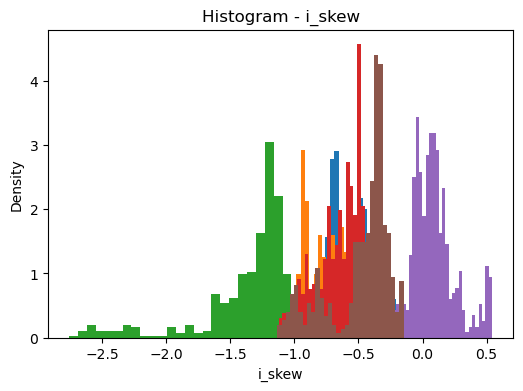

...

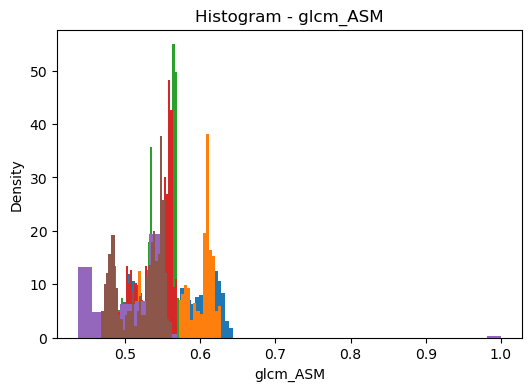

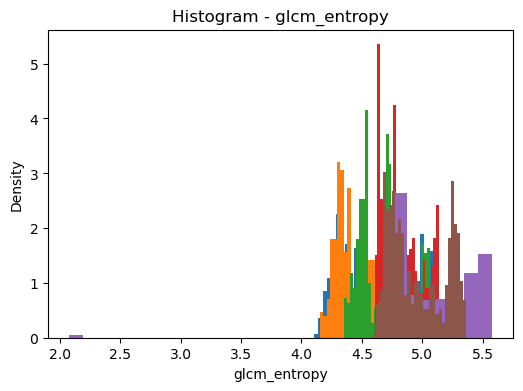

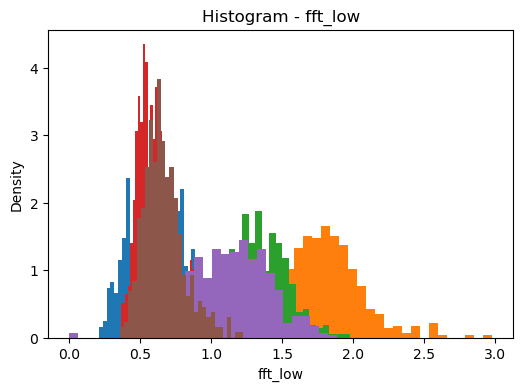

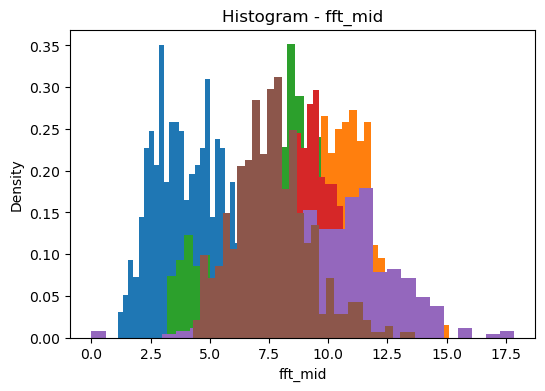

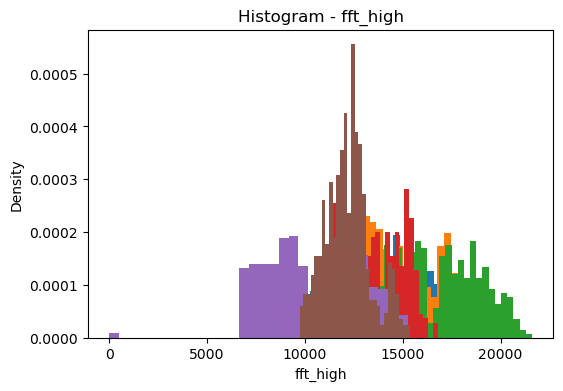

In [17]:
for feat in num_feats:
    plt.figure(figsize = (6,4))
    for emb in embryos:
        vals = df.loc[df["embryo_id"]== emb, feat].dropna()
        plt.hist(vals, bins=30, label=emb, density=True,)
    plt.title(f"Histogram - {feat}")
    plt.xlabel(feat)
    plt.ylabel("Density")
    plt.show

In [19]:
num_cols = df.select_dtypes(include=[float, int]).columns.tolist()
# remove colums as target/índices from X
for c in ["frame_idx"]:
    if c in num_cols:
        num_cols.remove(c)

X = df[num_cols].values
y = df["genotype"].values
groups = df["group"].values

# Remove rows with NaN on X
mask_ok = ~np.isnan(X).any(axis=1)
X = X[mask_ok]
y = y[mask_ok]
groups = groups[mask_ok]

X.shape, np.unique(y), len(np.unique(groups))

((2698, 25), array(['Control', 'Mutant'], dtype=object), 6)

In [20]:
# list of all numeric features
num_features = [c for c in df.columns if c not in ["embryo_id","frame_idx","genotype","group"]]

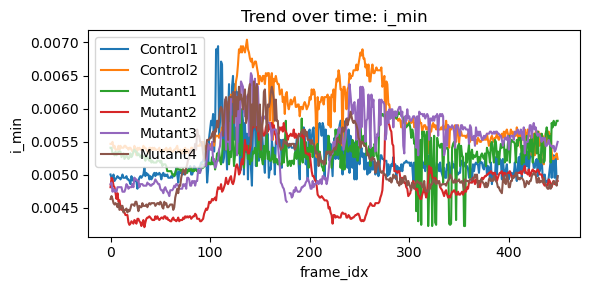

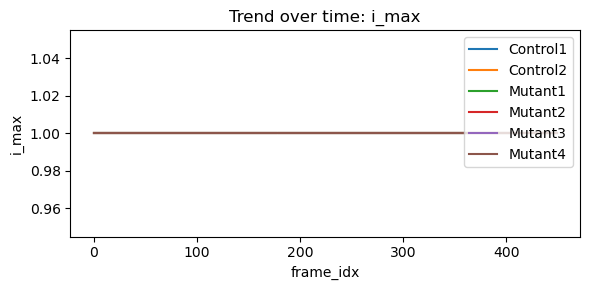

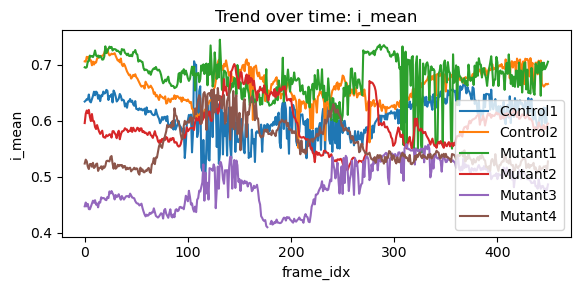

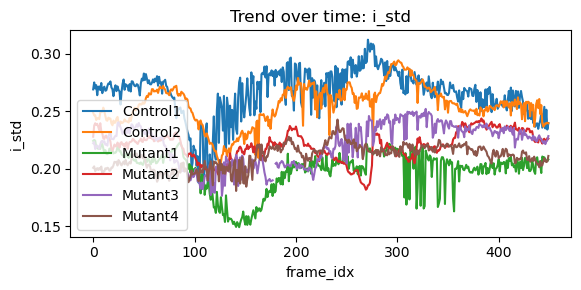

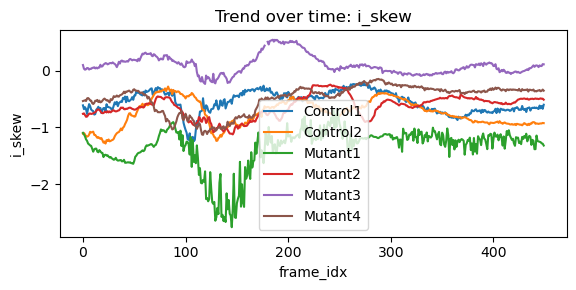

...

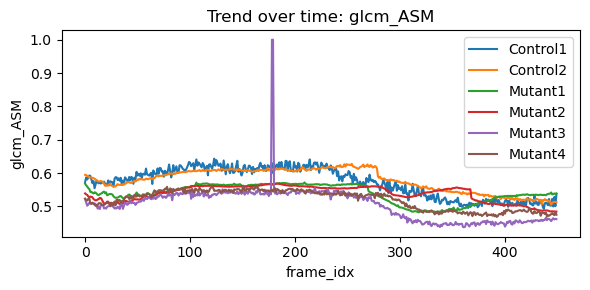

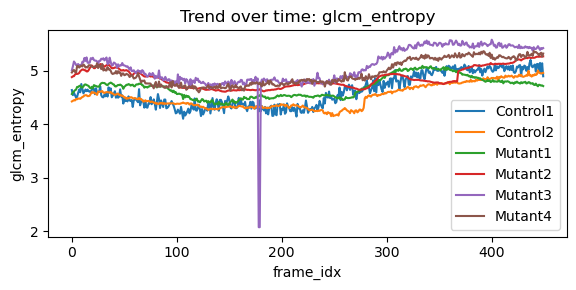

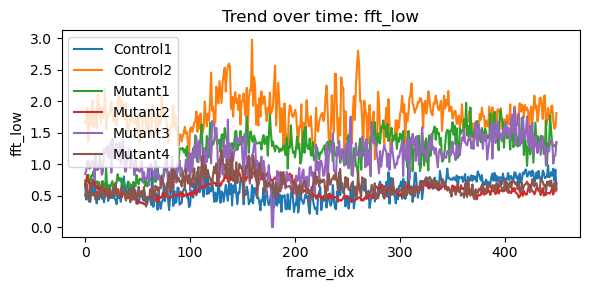

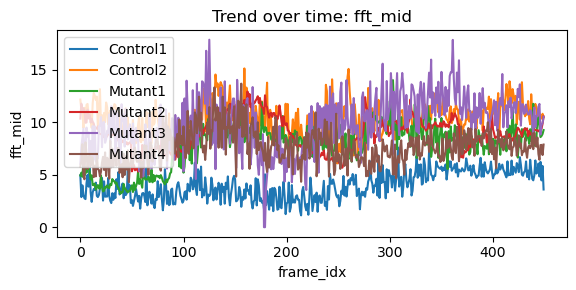

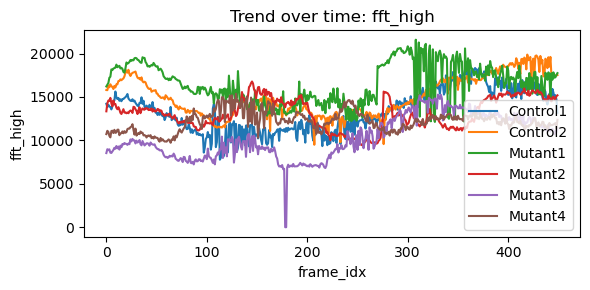

In [21]:
for feat in num_features:
    plt.figure(figsize=(6,3))
    for lab in df["embryo_id"].unique():
        sub = df[df["embryo_id"]==lab]
        trend = sub.groupby("frame_idx")[feat].mean()
        plt.plot(trend.index, trend.values, label=lab)
    plt.title(f"Trend over time: {feat}")
    plt.xlabel("frame_idx")
    plt.ylabel(feat)
    plt.legend()
    plt.tight_layout()
    plt.show()

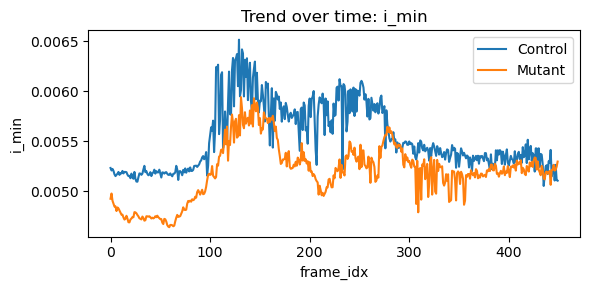

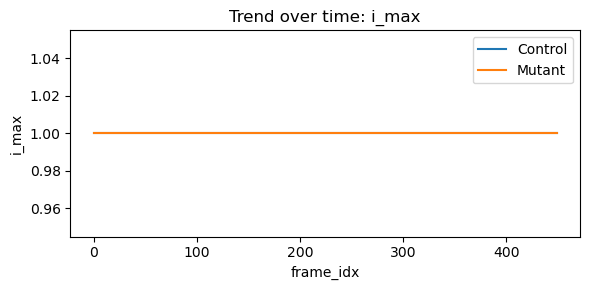

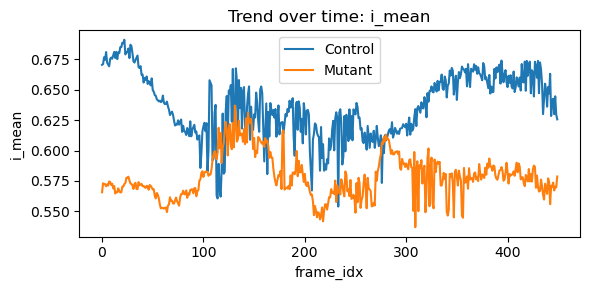

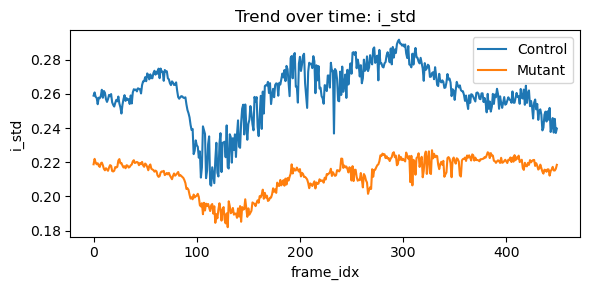

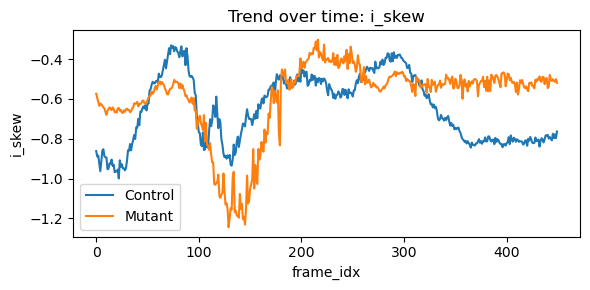

...

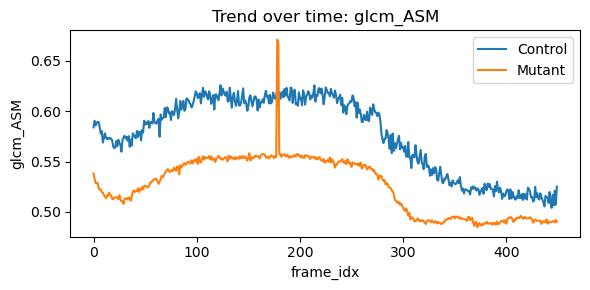

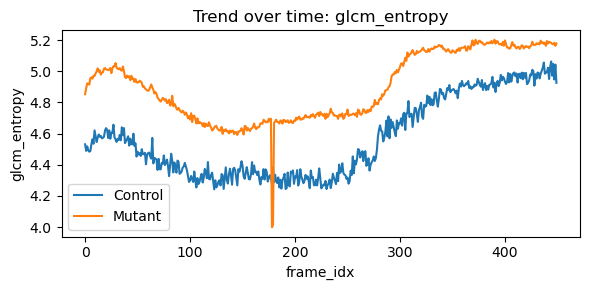

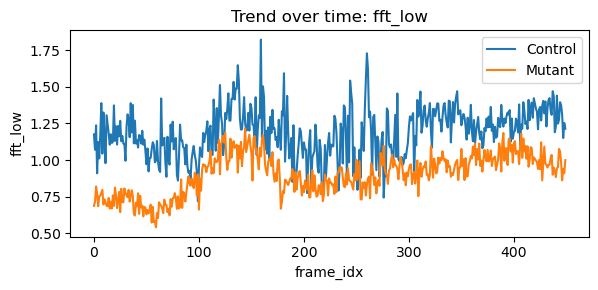

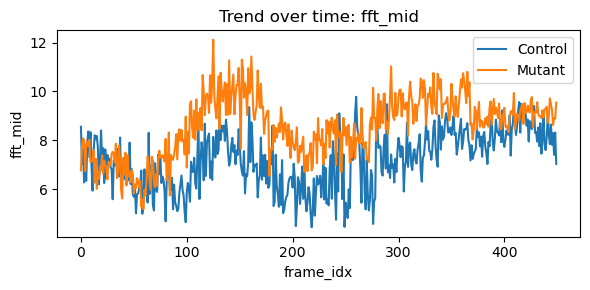

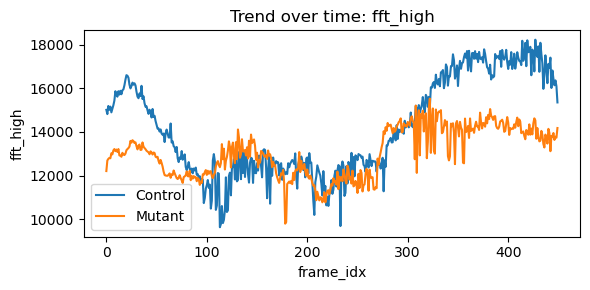

In [22]:
for feat in num_features:
    plt.figure(figsize=(6,3))
    for lab in df["genotype"].unique():
        sub = df[df["genotype"]==lab]
        trend = sub.groupby("frame_idx")[feat].mean()
        plt.plot(trend.index, trend.values, label=lab)
    plt.title(f"Trend over time: {feat}")
    plt.xlabel("frame_idx")
    plt.ylabel(feat)
    plt.legend()
    plt.tight_layout()
    plt.show()

In [23]:
num_cols = df.select_dtypes(include=[float, int]).columns.tolist()
# remove colums as target/índices from X
for c in ["frame_idx"]:
    if c in num_cols:
        num_cols.remove(c)

X = df[num_cols].values
y = df["genotype"].values
groups = df["group"].values

# Remove rows with NaN on X
mask_ok = ~np.isnan(X).any(axis=1)
X = X[mask_ok]
y = y[mask_ok]
groups = groups[mask_ok]

X.shape, np.unique(y), len(np.unique(groups))

((2698, 25), array(['Control', 'Mutant'], dtype=object), 6)

In [24]:
# X, y, groups are already defined from your previous cell

#Build a group-level table: one row per embryo (group) with its label
gdf = pd.DataFrame({"group": groups, "y": y}).drop_duplicates()

#Stratified split on GROUPS (not frames), preserving class balance
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.33, random_state=42)
train_g_idx, test_g_idx = next(sss.split(gdf["group"], gdf["y"]))

train_groups = set(gdf["group"].values[train_g_idx])
test_groups  = set(gdf["group"].values[test_g_idx])

train_mask = np.array([g in train_groups for g in groups])
test_mask  = ~train_mask

Xtr, Xte = X[train_mask], X[test_mask]
ytr, yte = y[train_mask], y[test_mask]

# Safety checks
assert len(np.unique(ytr)) == 2, f"Train has 1 class: {np.unique(ytr)}"
assert len(np.unique(yte)) == 2, f"Test has 1 class:  {np.unique(yte)}"

#Pipeline (scale + logistic regression)
pipe = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", LogisticRegression(max_iter=1000, C=1.0, class_weight="balanced")),
])

pipe.fit(Xtr, ytr)
yhat = pipe.predict(Xte)

print("Confusion matrix [Control, Mutant]:")
print(confusion_matrix(yte, yhat, labels=["Control","Mutant"]))
print(classification_report(yte, yhat, digits=4))

Confusion matrix [Control, Mutant]:
[[284 166]
 [  0 450]]
              precision    recall  f1-score   support

     Control     1.0000    0.6311    0.7738       450
      Mutant     0.7305    1.0000    0.8443       450

    accuracy                         0.8156       900
   macro avg     0.8653    0.8156    0.8091       900
weighted avg     0.8653    0.8156    0.8091       900



In [25]:
# group-stratified split (one per embryo)
y = df["genotype"].values
groups = df["group"].values
gdf = pd.DataFrame({"group": groups, "y": y}).drop_duplicates()

sss = StratifiedShuffleSplit(n_splits=1, test_size=0.33, random_state=42)
train_g_idx, test_g_idx = next(sss.split(gdf["group"], gdf["y"]))
train_groups = set(gdf["group"].values[train_g_idx])
train_mask = np.array([g in train_groups for g in groups])
test_mask  = ~train_mask

# safety: ensure both classes exist
assert len(np.unique(y[train_mask])) == 2
assert len(np.unique(y[test_mask])) == 2

# define buckets
cols = df.columns
buckets = {
    "A_intensity":  [c for c in cols if c in
                     ["i_min","i_max","i_mean","i_std","i_skew","i_kurt","area_mask"]],
    "B_shape":      [c for c in cols if c.startswith("shape_")],
    "C_glcm":       [c for c in cols if c.startswith("glcm_")],
    "D_fft":        [c for c in cols if c.startswith("fft_")],
    "ALL":          [c for c in cols if c not in ["embryo_id","frame_idx","genotype","group"]],
}

def sanitize_cols(col_list):
# drop cols with NaN anywhere OR constant in train
    good = []
    for c in col_list:
        if df[c].isna().any():        # remove columns that have NaN
            continue
        if df.loc[train_mask, c].nunique() <= 1:  # constant in train
            continue
        good.append(c)
    return good

#run baseline per bucket
results = {}
for name, cols_subset in buckets.items():
    cols_clean = sanitize_cols(cols_subset)
    if len(cols_clean) == 0:
        results[name] = "skipped (no usable cols)"
        continue

    Xtr = df.loc[train_mask, cols_clean].to_numpy()
    Xte = df.loc[test_mask,  cols_clean].to_numpy()
    ytr = y[train_mask]; yte = y[test_mask]

# if something went wrong and train has one class, skip
    if len(np.unique(ytr)) < 2:
        results[name] = "skipped (train one class)"
        continue

    pipe = Pipeline([
        ("scaler", StandardScaler()),
        ("clf", LogisticRegression(max_iter=1000, C=1.0, class_weight="balanced")),
    ])

    try:
        pipe.fit(Xtr, ytr)
        yhat = pipe.predict(Xte)
        f1 = f1_score(yte, yhat, average="macro")
        results[name] = round(f1, 4)
    except Exception as e:
        results[name] = f"skipped ({type(e).__name__})"

pd.Series(results)

A_intensity         skipped (NameError)
B_shape        skipped (no usable cols)
C_glcm              skipped (NameError)
D_fft               skipped (NameError)
ALL                 skipped (NameError)
dtype: object

In [26]:
#choose feature columns
use_cols = [c for c in df.columns if c not in ["embryo_id","frame_idx","genotype","group"]]

# build arrays
X_all = df[use_cols].to_numpy()
y_all = df["genotype"].to_numpy()
z_all = df["embryo_id"].to_numpy()

# keep only rows with all finite values
row_ok = np.isfinite(X_all).all(axis=1)
X_ok = X_all[row_ok]
y_ok = y_all[row_ok]
z_ok = z_all[row_ok]

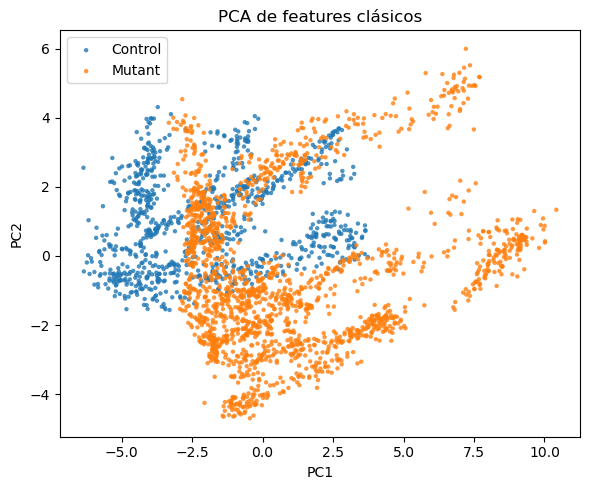

In [27]:

#scale, PCA(2)
Xp = StandardScaler().fit_transform(X_ok)
pca2 = PCA(n_components=2, random_state=42).fit_transform(Xp)

#plot using the *iltered y_ok
plt.figure(figsize=(6,5))
for lab in np.unique(y_ok):
    idx = (y_ok == lab)
    plt.scatter(pca2[idx, 0], pca2[idx, 1], s=10, alpha=0.8, label=lab, edgecolors="none")
plt.legend()
plt.title("PCA de features clásicos")
plt.xlabel("PC1"); plt.ylabel("PC2")
plt.tight_layout(); plt.show()

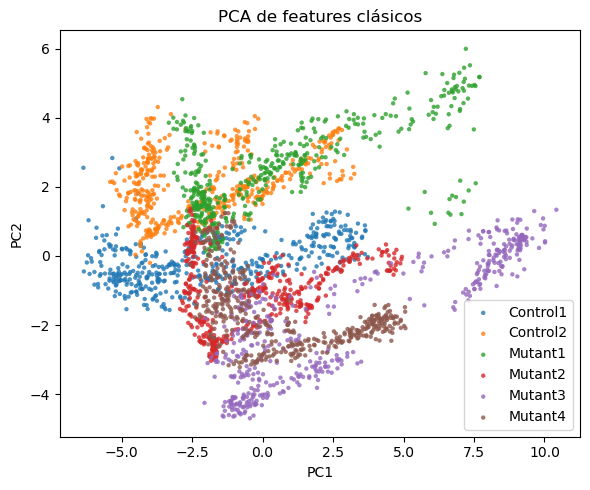

In [28]:
#scale, PCA(2)
Xp = StandardScaler().fit_transform(X_ok)
pca2 = PCA(n_components=2, random_state=42).fit_transform(Xp)

#plot using the *iltered y_ok
plt.figure(figsize=(6,5))
for lab in np.unique(z_ok):
    idx = (z_ok == lab)
    plt.scatter(pca2[idx, 0], pca2[idx, 1], s=10, alpha=0.8, label=lab, edgecolors="none")
plt.legend()
plt.title("PCA de features clásicos")
plt.xlabel("PC1"); plt.ylabel("PC2")
plt.tight_layout(); plt.show()

In [43]:

#Define buckets (feature groups)

cols_all = df.columns
buckets = {
    "A_intensity": ["i_min","i_max","i_mean","i_std","i_skew","i_kurt","area_mask"],
    "B_shape":     [c for c in cols_all if c.startswith("shape_")],
    "C_glcm":      [c for c in cols_all if c.startswith("glcm_")],
    "D_fft":       [c for c in cols_all if c.startswith("fft_")],
    "ALL":         [c for c in cols_all if c not in ["embryo_id","frame_idx","genotype","group"]],
}


In [36]:
# Prepare labels and plotting
def pca_scatter_for_columns1(df, cols, y, title):
    """
    - Selects 'cols' from df
    - Drops rows with any NaN/inf in those cols
    - Standardizes
    - If >=2 cols -> PCA to 2D; if 1 col -> 1D "PCA" and plot against 0
    - Scatter by class labels in y
    """
    # nothing to do if no columns
    if len(cols) == 0:
        print(f"[SKIP] {title} (no columns)")
        return

    X = df[cols].to_numpy()
    mask = np.isfinite(X).all(axis=1)
    X = X[mask]
    y = y[mask]

    # guard: if nothing left
    if X.shape[0] == 0:
        print(f"[SKIP] {title} (no valid rows after NaN/inf filter)")
        return

    # standardize
    Xs = StandardScaler().fit_transform(X)

    # do PCA or "1D projection"
    if Xs.shape[1] >= 2:
        Z = PCA(n_components=2, random_state=42).fit_transform(Xs)
    else:
        # single-feature: use standardized values as PC1, zeros for PC2
        Z = np.column_stack([Xs.ravel(), np.zeros_like(Xs.ravel())])

    # 2D scatter
    plt.figure(figsize=(6,5))
    for lab in np.unique(y):
        idx = (y == lab)
        plt.scatter(Z[idx, 0], Z[idx, 1], s=10, alpha=0.8, label=str(lab), edgecolors='none')
    plt.legend()
    plt.title(title)
    plt.xlabel("PC1" if Xs.shape[1] >= 2 else f"{cols[0]} (standardized)")
    plt.ylabel("PC2" if Xs.shape[1] >= 2 else "0")
    plt.tight_layout()
    plt.show()


In [ ]:
def pca_scatter_for_columns(df, cols, labels, title="PCA plot"):
    X = df[cols].values
    labs = np.asarray(labels)
    n_features = X.shape[1]

    # --- encode labels to integers for coloring ---
    if labs.dtype.kind in ("U", "S", "O"):  # strings / objects
        unique_labs = np.unique(labs)
        lab_to_int = {lab: i for i, lab in enumerate(unique_labs)}
        lab_int = np.array([lab_to_int[lab] for lab in labs])
    else:
        lab_int = labs.astype(float)
        unique_labs = np.unique(labs)
        lab_to_int = {lab: lab for lab in unique_labs}

    # case 1: 2+ features -> real PCA 2D
    if n_features >= 2:
        pca = PCA(n_components=2)
        Z = pca.fit_transform(X)

        plt.figure(figsize=(6, 5))
        sc = plt.scatter(Z[:, 0], Z[:, 1],
                         c=lab_int, s=10, alpha=0.7, cmap="tab10")
        plt.xlabel("PC1")
        plt.ylabel("PC2")
        plt.title(title)

        cbar = plt.colorbar(sc)
        cbar.set_ticks(range(len(unique_labs)))
        cbar.set_ticklabels(unique_labs)
        cbar.set_label("Label")

        plt.tight_layout()
        plt.show()

    # case 2: only 1 feature -> plot raw feature vs frame index 
    else:
        y = X[:, 0]
        x = np.arange(len(y))

        plt.figure(figsize=(6, 4))
        sc = plt.scatter(x, y,
                         c=lab_int, s=10, alpha=0.7, cmap="tab10")
        plt.xlabel("Frame index")
        plt.ylabel(cols[0])
        plt.title(f"{title} (raw feature, no PCA)")

        cbar = plt.colorbar(sc)
        cbar.set_ticks(range(len(unique_labs)))
        cbar.set_ticklabels(unique_labs)
        cbar.set_label("Label")

        plt.tight_layout()
        plt.show()

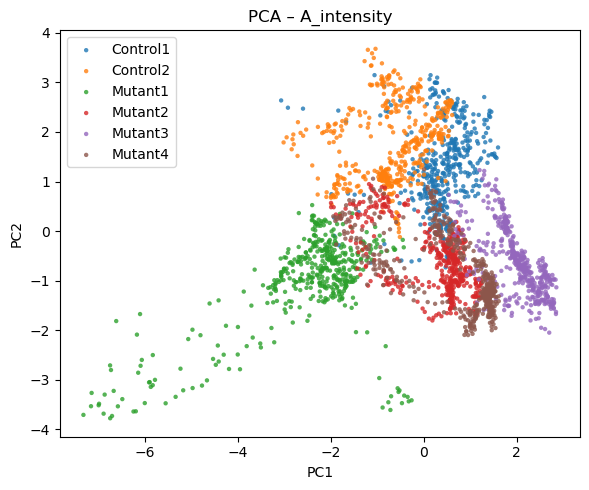

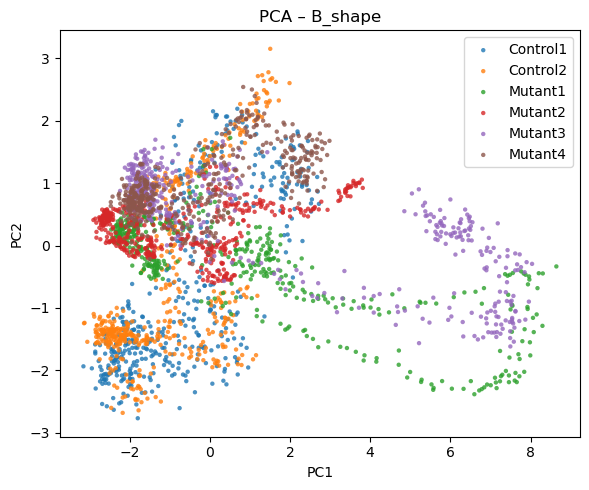

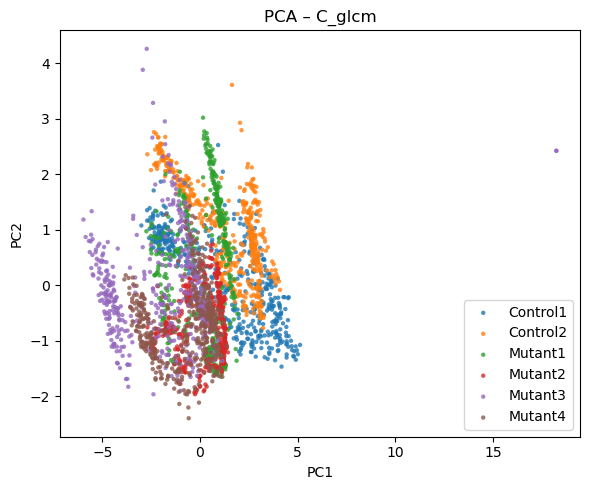

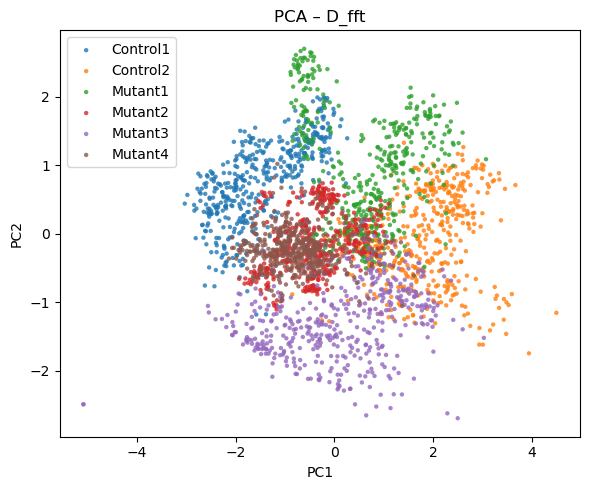

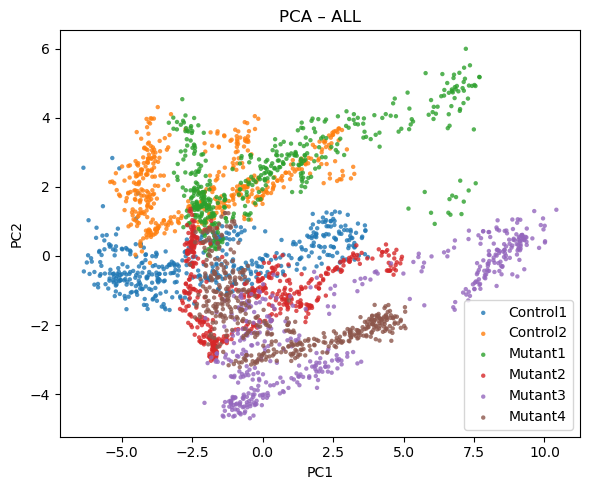

In [37]:
for name, cols in buckets.items():
    # keep only columns that actually exist
    cols_existing = [c for c in cols if c in df.columns]
    pca_scatter_for_columns1(df, cols_existing, z_all, title=f"PCA – {name}")


Total single features to plot: 25


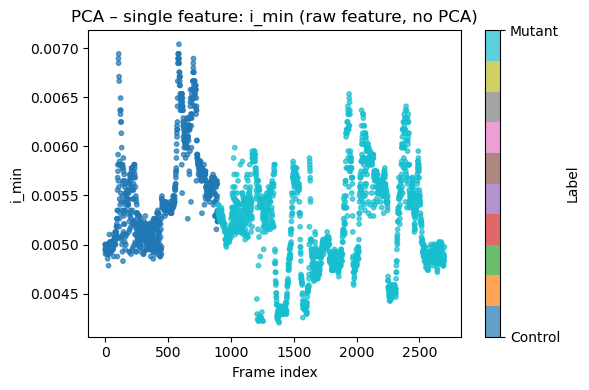

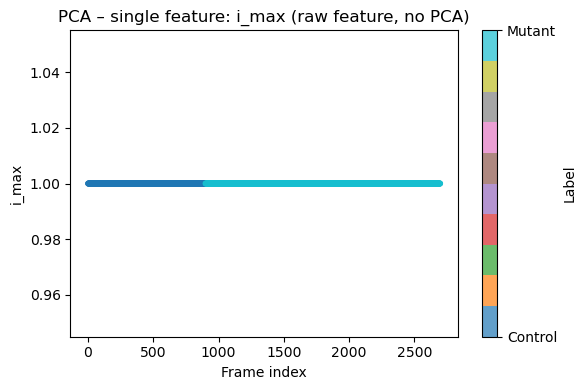

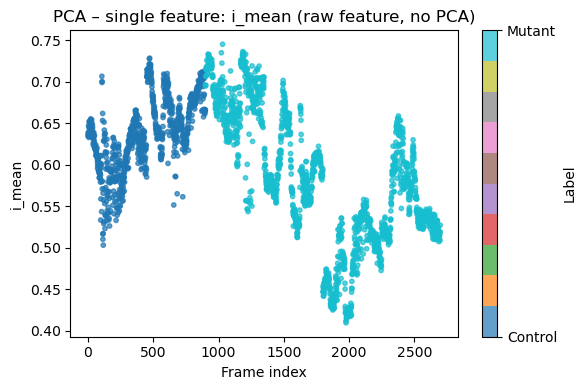

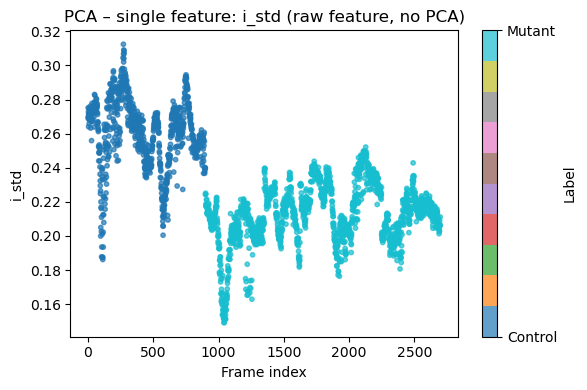

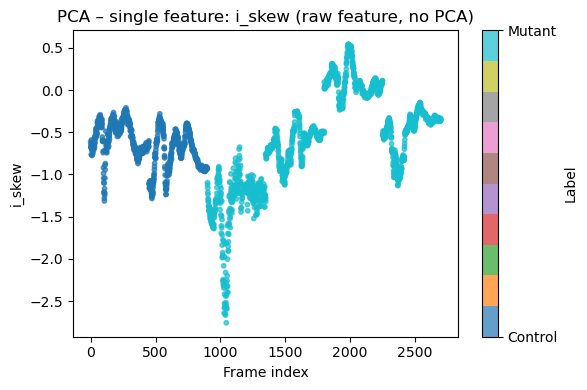

...

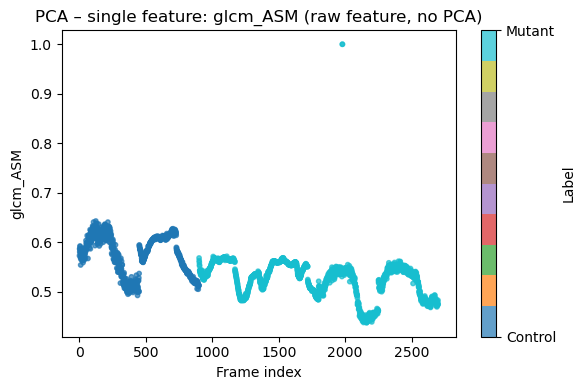

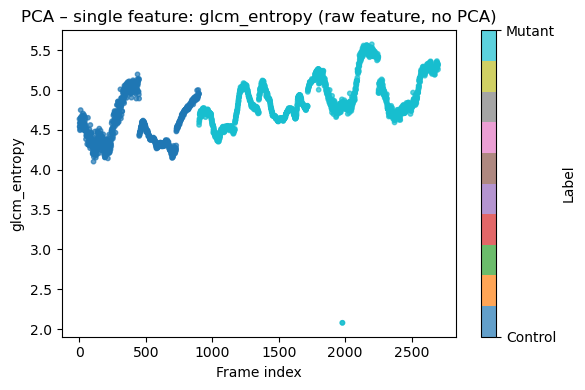

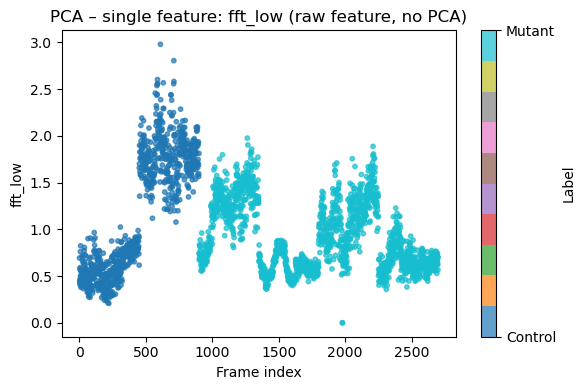

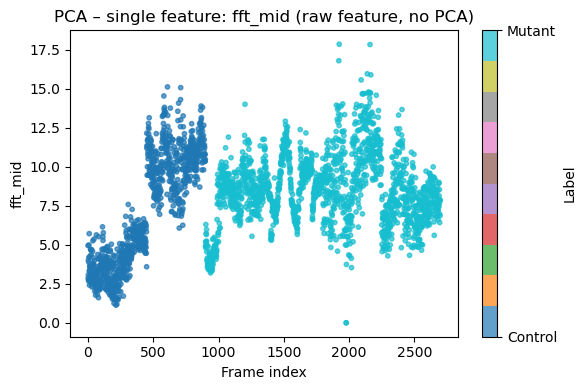

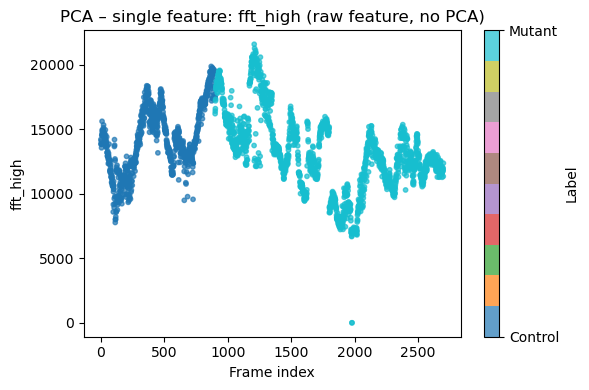

In [46]:
#PCA for each single feature
single_features = [c for c in buckets["ALL"] if c in df.columns]
print(f"Total single features to plot: {len(single_features)}")

for c in single_features:
    pca_scatter_for_columns1(df, [c], y_all, title=f"PCA – single feature: {c}")

Total single features to plot: 25


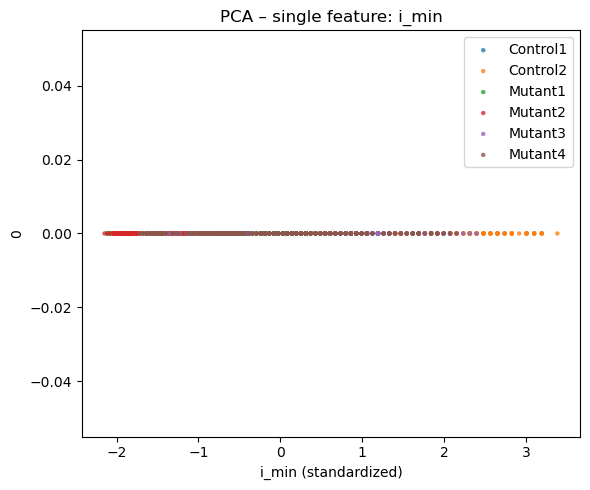

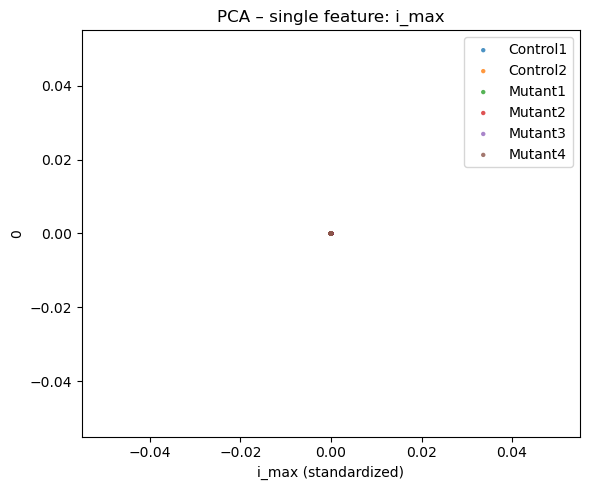

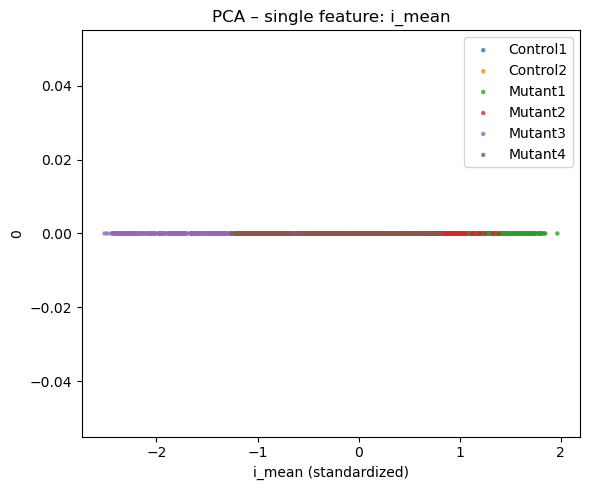

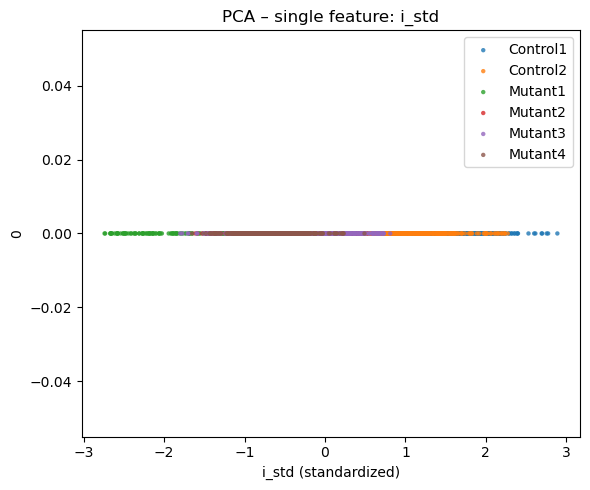

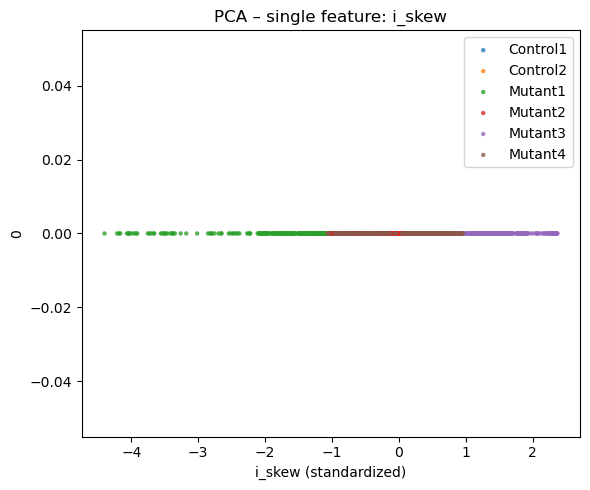

...

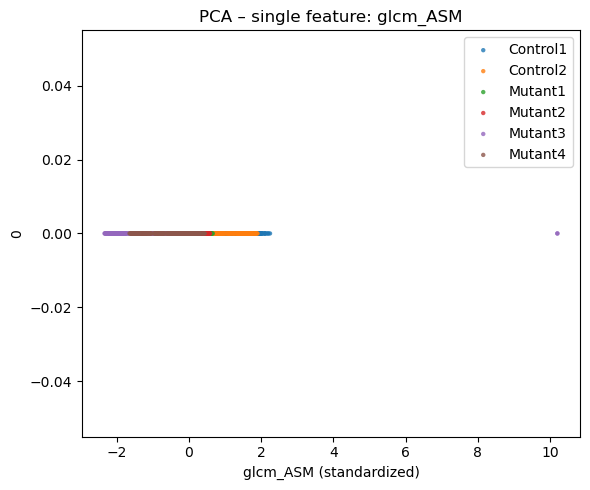

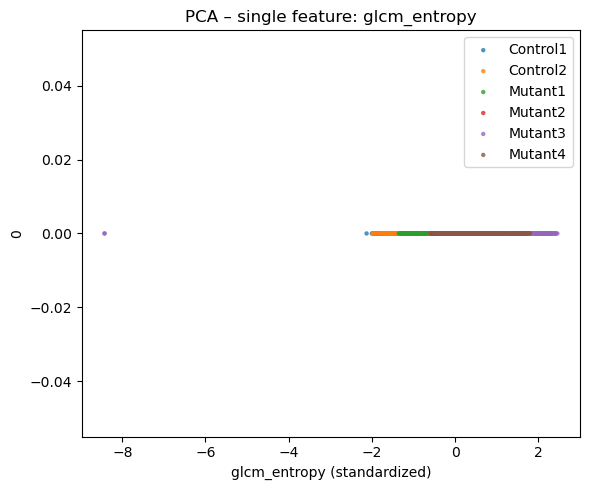

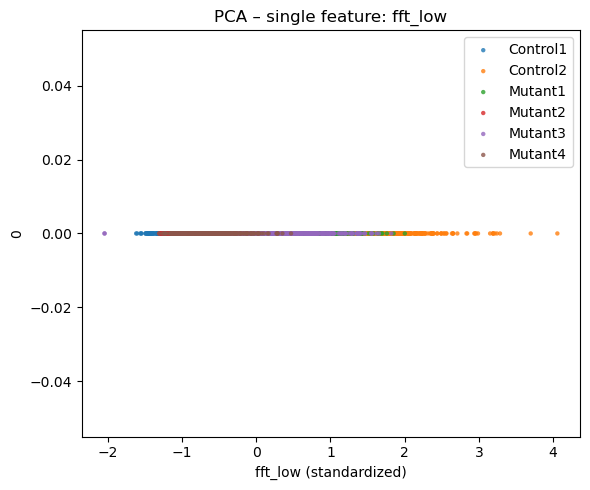

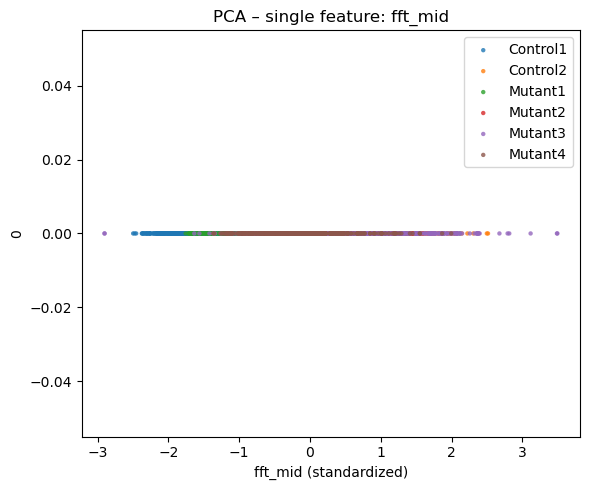

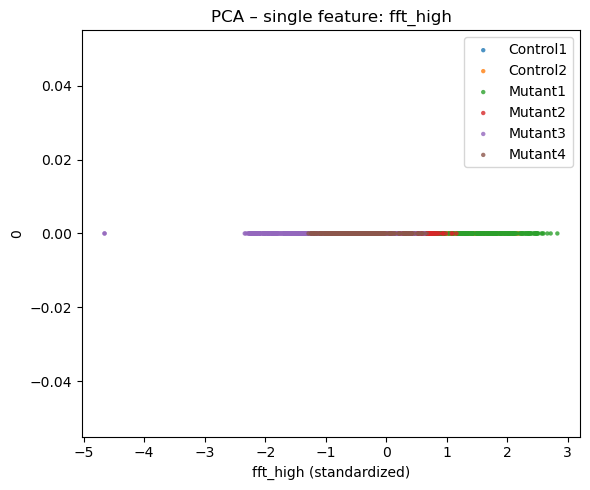

In [41]:
#PCA for each single feature
single_features = [c for c in buckets["ALL"] if c in df.columns]
print(f"Total single features to plot: {len(single_features)}")

for c in single_features:
    pca_scatter_for_columns1(df, [c], z_all, title=f"PCA – single feature: {c}")

Total single features to plot: 25


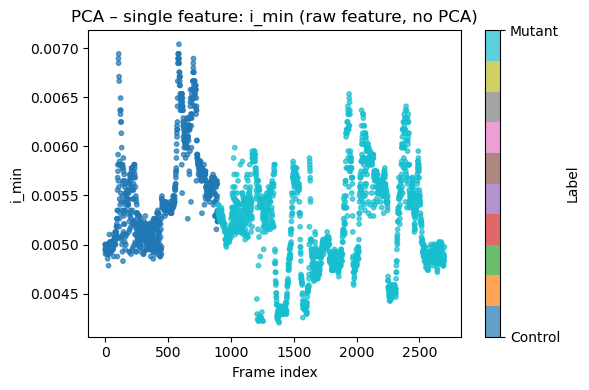

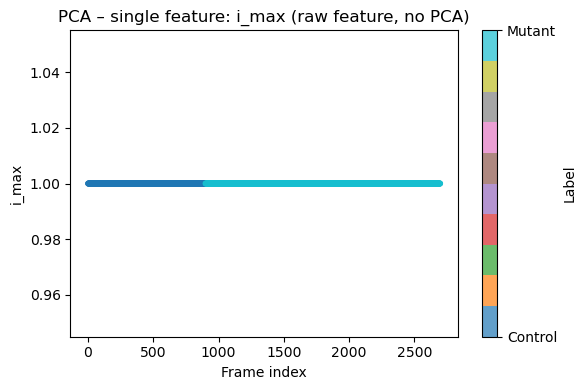

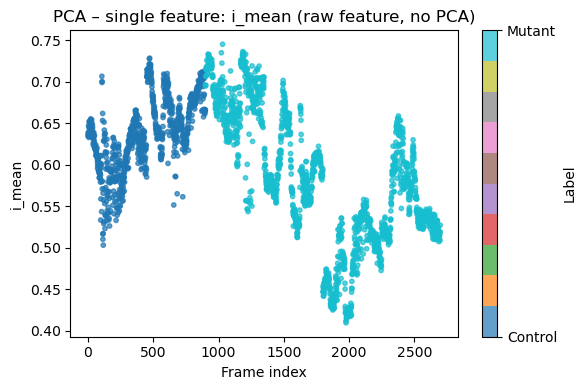

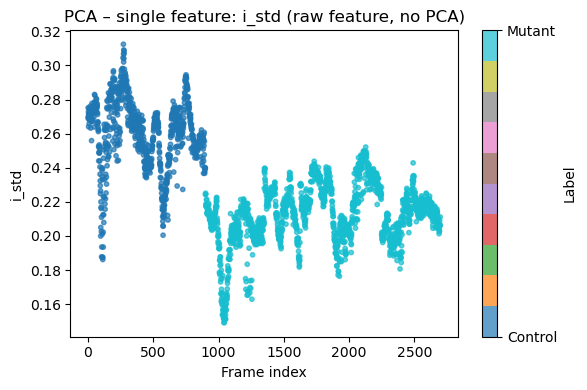

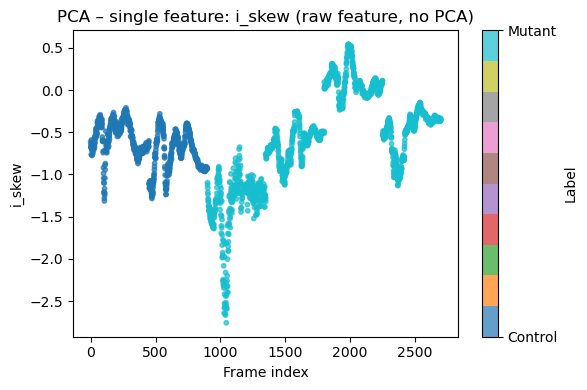

...

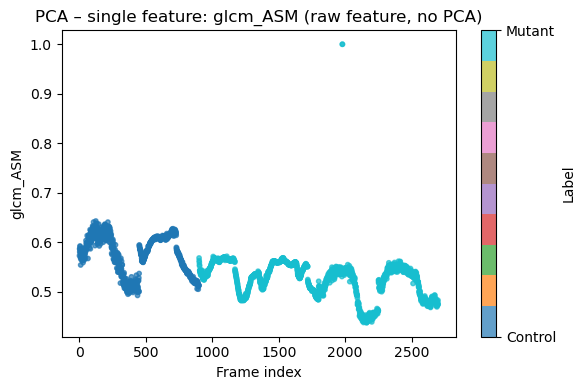

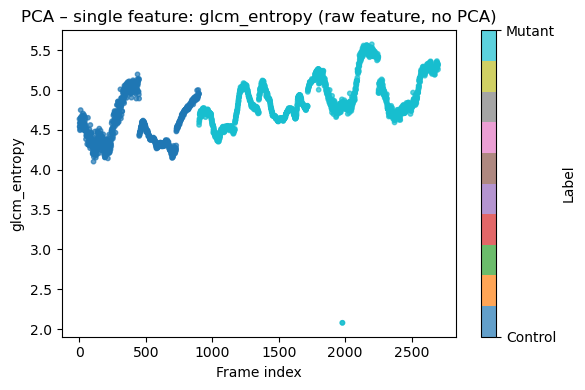

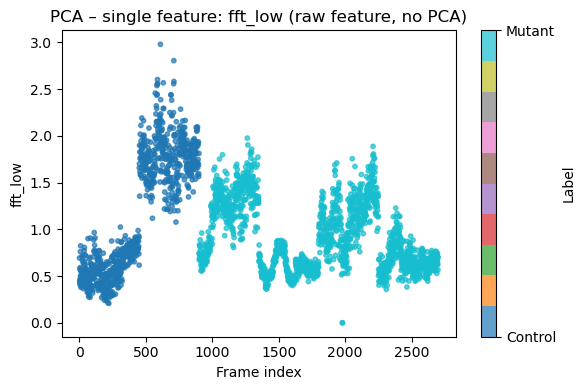

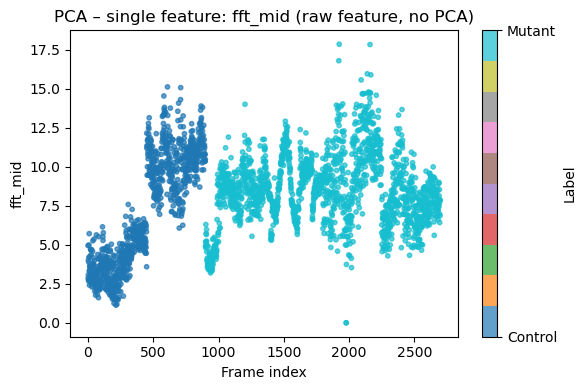

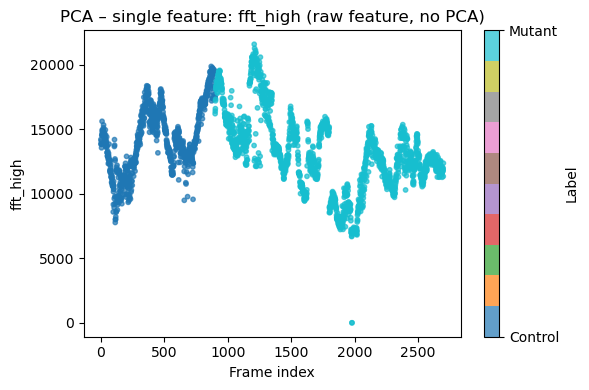

In [38]:
single_features = [c for c in buckets["ALL"] if c in df.columns]
print(f"Total single features to plot: {len(single_features)}")

for c in single_features:
    pca_scatter_for_columns(df, [c], y_all, title=f"PCA – single feature: {c}")

Total single features to plot: 25


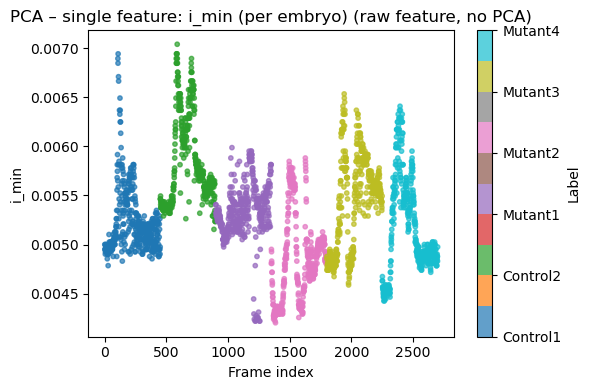

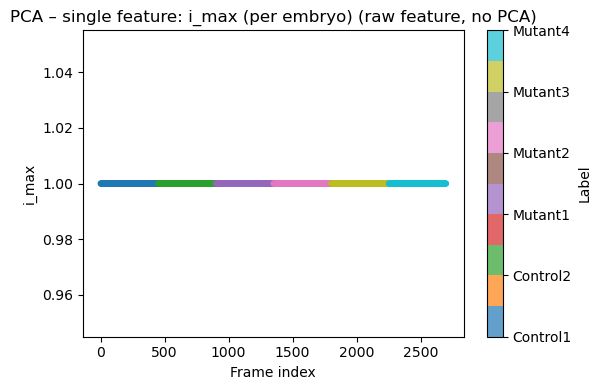

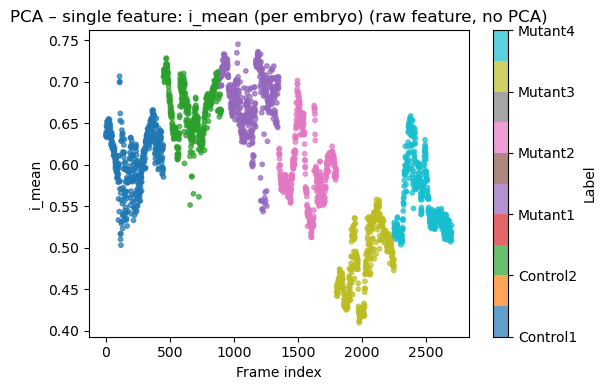

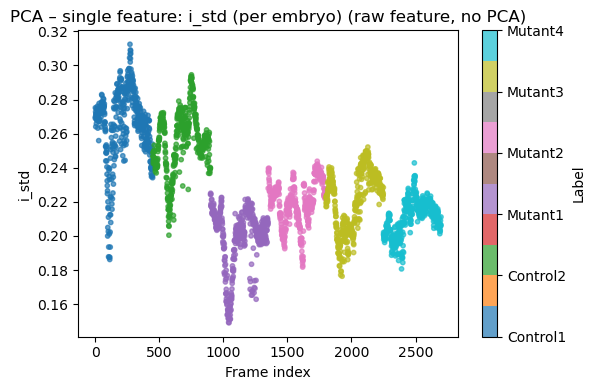

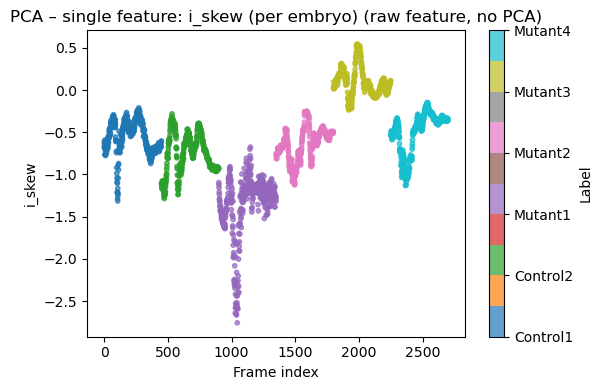

...

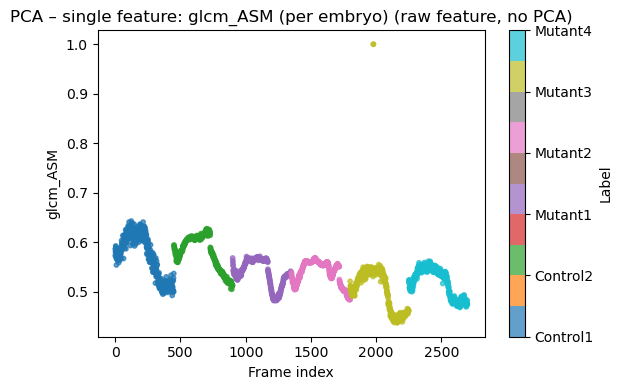

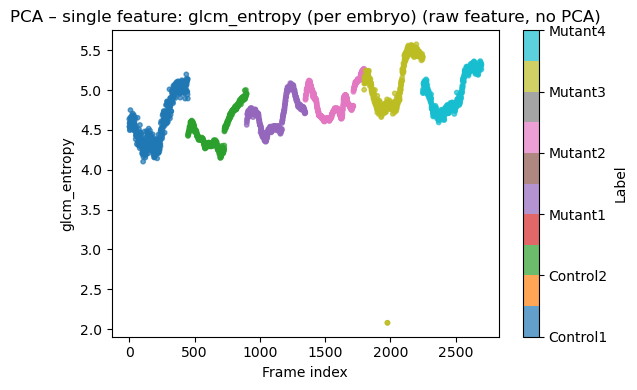

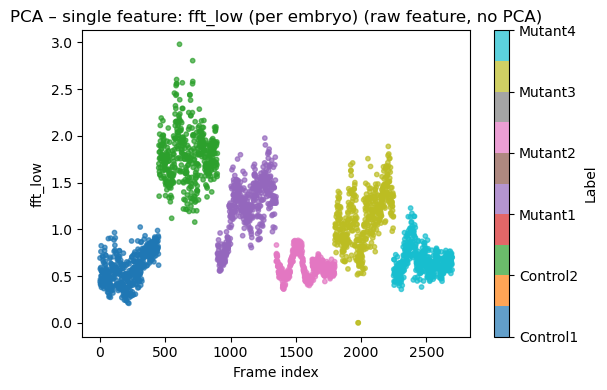

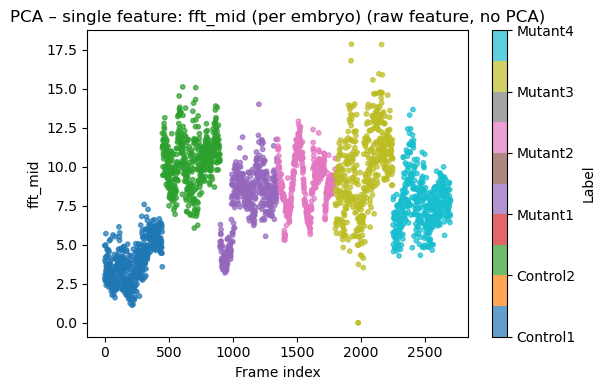

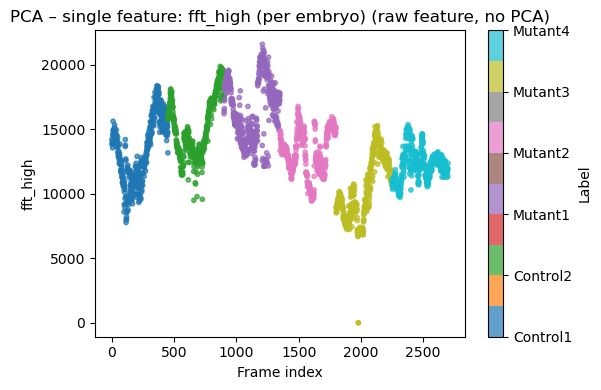

In [39]:
z_all = df["embryo_id"].to_numpy()
single_features = [c for c in buckets["ALL"] if c in df.columns]
print(f"Total single features to plot: {len(single_features)}")

for c in single_features:
    pca_scatter_for_columns(
        df,
        [c],
        z_all,  #now coloring per embryo
        title=f"PCA – single feature: {c} (per embryo)"
    )
